
<image src="https://raw.githubusercontent.com/ramiro999/depth-passive-sesion4/main/images/cover-page.png" width=100%>


# <font color="EB9A54"><center> **Hands-On Sesión 5: Estimación pasiva de la profundidad 📷 🤖** </center></font>

Hasta el momento hemos aprendido los conceptos en el estudio de visión estereo! Ahora llevesmolo al siguiente nivel 😎 🚪

<div align="center"> <image src="https://github.com/semilleroCV/Hands-on-Computer-Vision/blob/main/Sesiones/Sesion5/Parte%201/images/metodologia.png?raw=true" width=800>  </div>

# <font color="4C5FDA"> <center> **Motivación** </center> </font>

El Sistema de Puerta Automática con Detección de Rostros y Visión Estéreo es una solución de vanguardia que combina el reconocimiento facial con tecnología de visión computarizada para brindar una experiencia de acceso sin contacto, segura y conveniente. Utilizando un conjunto de cámaras estéreo de alta resolución y algoritmos avanzados de procesamiento de imágenes, este sistema inteligente es capaz de identificar a las personas autorizadas y abrir automáticamente las puertas cuando se encuentren a una distancia predeterminada.

Te invito a que veas el proceso y lo pruebes por tu propia cuenta:



In [1]:
#@title **Instalamos algunos paquetes**

!pip install opencv-python
!pip install mediapipe

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.6/35.6 MB 10.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 14.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 49.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 2.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.6/121.6 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.5/56.5 MB 11.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.2/124.2 MB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 196.0/196.0 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 166.0/166.0 MB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.1/99.1 kB 14.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━

In [2]:
#@title **Cargamos librerias**
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import cv2 as cv
import glob
import requests
from PIL import Image
from io import BytesIO
import matplotlib
matplotlib.rcParams['figure.figsize'] = (20.0, 20.0)
import sys
# Mediapipe for face detection
import mediapipe as mp
from mediapipe.python.solutions import face_detection as mp_facedetector
from mediapipe.python.solutions import drawing_utils as mp_draw
import time
import seaborn as sns
sys.path.append("..")

In [3]:
!git clone https://github.com/semilleroCV/Hands-on-Computer-Vision.git
!cp -r Hands-on-Computer-Vision/Sesiones/Sesion5/Parte-2/datasets datasets
!rm -rf Hands-on-Computer-Vision

Cloning into 'Hands-on-Computer-Vision'...
remote: Enumerating objects: 684, done.
remote: Counting objects: 100% (137/137), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 684 (delta 119), reused 92 (delta 92), pack-reused 547
Receiving objects: 100% (684/684), 359.36 MiB | 19.91 MiB/s, done.
Resolving deltas: 100% (272/272), done.
Updating files: 100% (165/165), done.


In [4]:
#@title **Funciones necesarias**
def mostrar_imagenes(imagen_izquierda, imagen_derecha):

    imagen_izquierda = cv.cvtColor(imagen_izquierda, cv.COLOR_BGR2RGB)
    imagen_derecha = cv.cvtColor(imagen_derecha, cv.COLOR_BGR2RGB)

    # Configura el tamaño del plot
    plt.figure(figsize=(15, 9))

    # Muestra la imagen izquierda
    plt.subplot(1, 2, 1)  # 1 fila, 2 columnas, posición 1
    plt.imshow(imagen_izquierda)
    plt.title('Imagen Izquierda')  # Agrega un título a la primera imagen
    plt.axis('off')  # Oculta los ejes

    # Muestra la imagen derecha
    plt.subplot(1, 2, 2)  # 1 fila, 2 columnas, posición 2
    plt.imshow(imagen_derecha)
    plt.title('Imagen Derecha')  # Agrega un título a la segunda imagen
    plt.axis('off')  # Oculta los ejes

    # Muestra el plot con ambas imágenes
    plt.show()

## <font color='#EB9A54'>**Configuración**</font>

Nuestra configuración consiste en 2 camaras Logitech:

<div align="center"> <image src="https://raw.githubusercontent.com/ramiro999/depth-passive-session5/main/images/setup-2.jpeg" width=700>  </div>


Referencia de cámaras utilizadas:

*   Logitech **C920e** HD 1080p Sensor CMOS
*   ​Logitech **C910** HD 1080p Sensor CMOS



## <font color='#EB9A54'>**Calibración Y Rectificación**</font>

<font color="4C5FDA"> **Paso 1:** </font> El primer paso es capturar las imagenes inicializando las camaras con la función de video openCV `cv2.VideoCapture` guardar los fotogramas con `cv2.imwrite`. Desde este notebook el paso es mas sencillo❗ Solo tienes que cargar el dataset ⤵

### <font color='#EB9A54'>**Carga el dataset**</font>

(-0.5, 639.5, 479.5, -0.5)

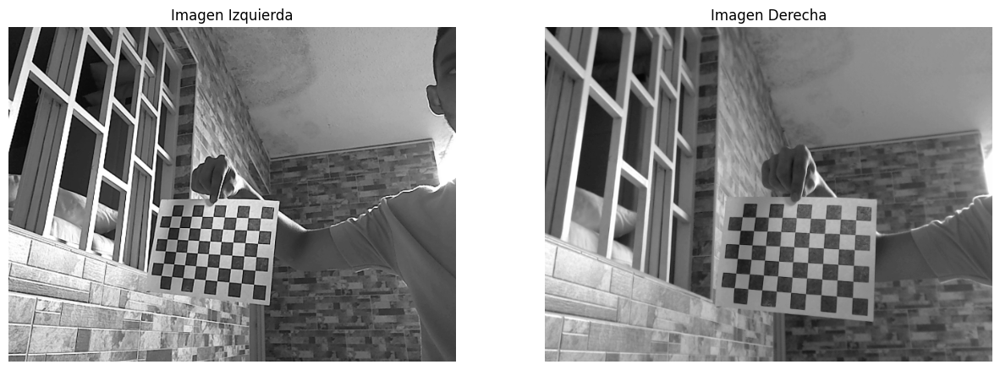

In [5]:
# Cargar las imagenes

imgL = "datasets/stereoLeft/imageL5.png"
imgR = "datasets/stereoRight/imageR5.png"

left_image_path = cv.imread(imgL, cv.IMREAD_GRAYSCALE)
rigth_image_path = cv.imread(imgR, cv.IMREAD_GRAYSCALE)

# Visualiza ambas imagenes

plt.figure(figsize=(15,9))
plt.subplot(1, 2, 1)
plt.imshow(left_image_path, cmap= 'gray')
plt.title('Imagen Izquierda')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(rigth_image_path, cmap= 'gray')
plt.title('Imagen Derecha')
plt.axis('off')

<font color="4C5FDA"> **Paso 2:** </font> El segundo paso es determinar la relación entre las cámaras y sus parámetros intrínsecos. Seguimos la forma estándar de hacer esto usando un tablero de ajedrez y enumerando las coincidencias entre las dos imágenes usando `cv.findChessboardCorners().` Como esto se hace dentro de openCV, es importante verificar los resultados utilizando `cv.drawChessboardCorners()` y ver las imágenes resultantes para comprobar si las coincidencias se realizaron correctamente.

### <font color='#EB9A54'>**Encuentra las esquinas del ajedrez**</font>

Número de imágenes izquierdas encontradas: 11
Número de imágenes derechas encontradas: 11


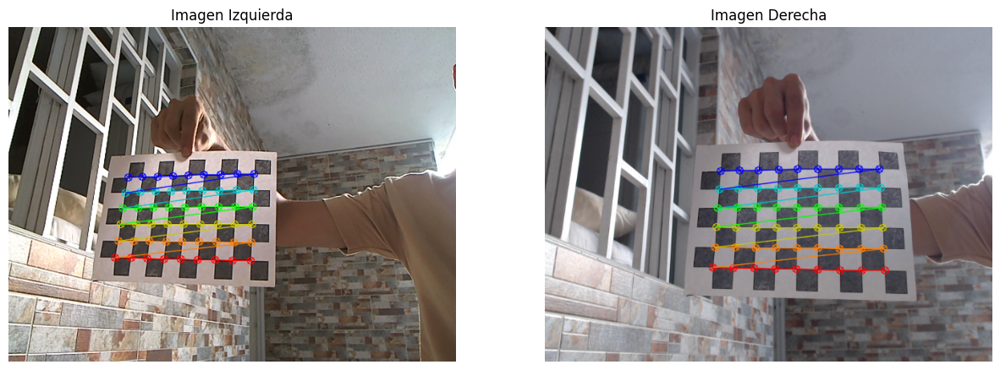

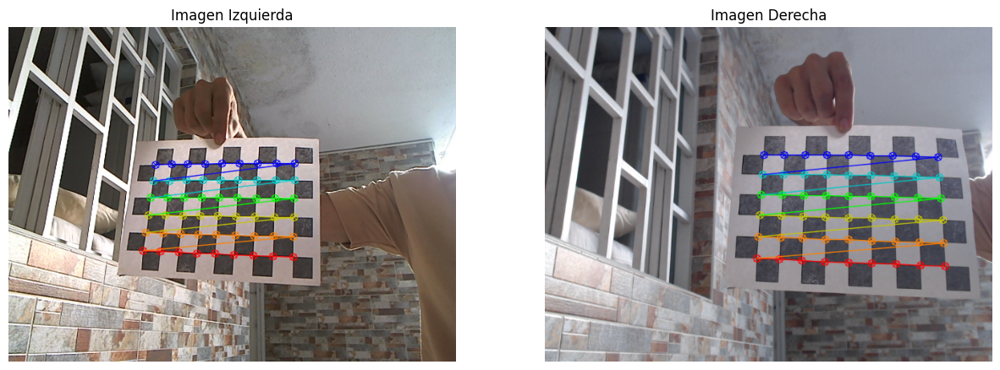

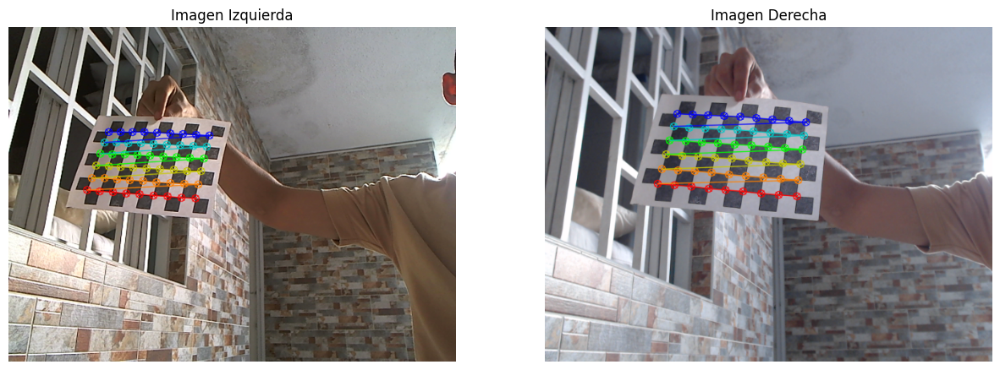

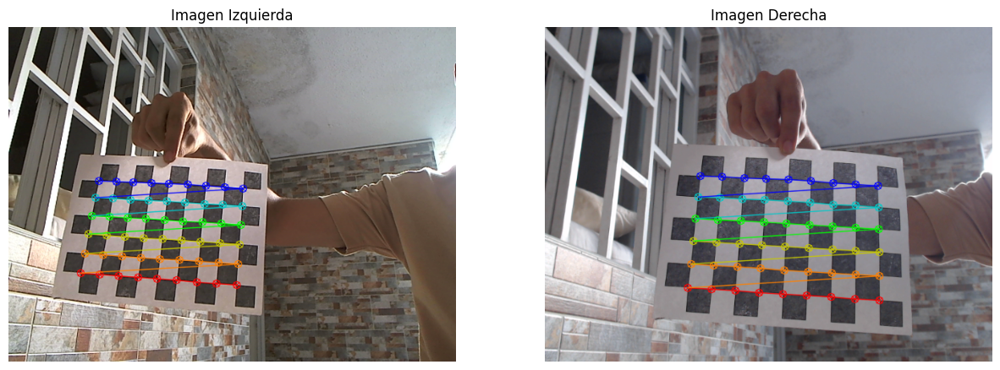

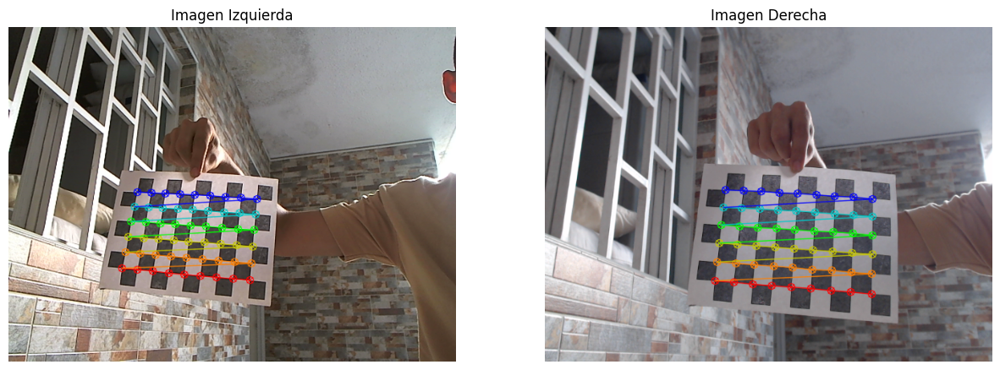

...

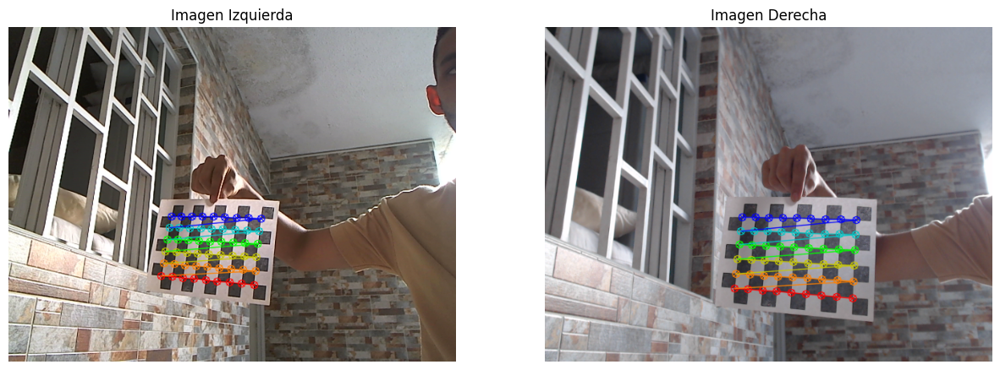

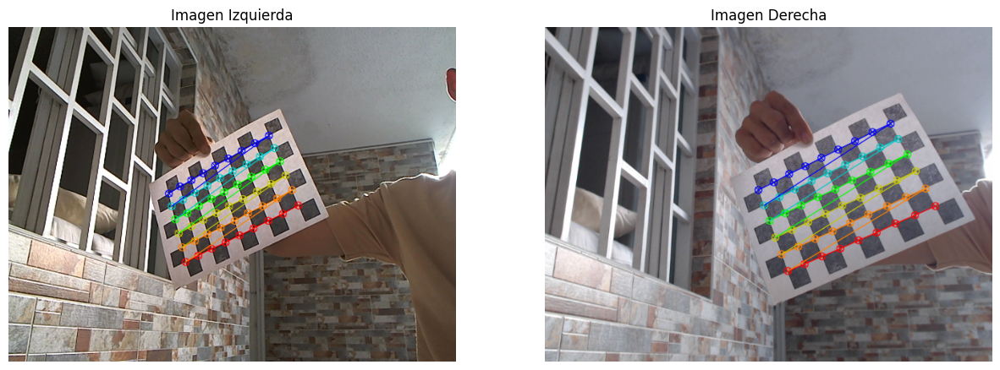

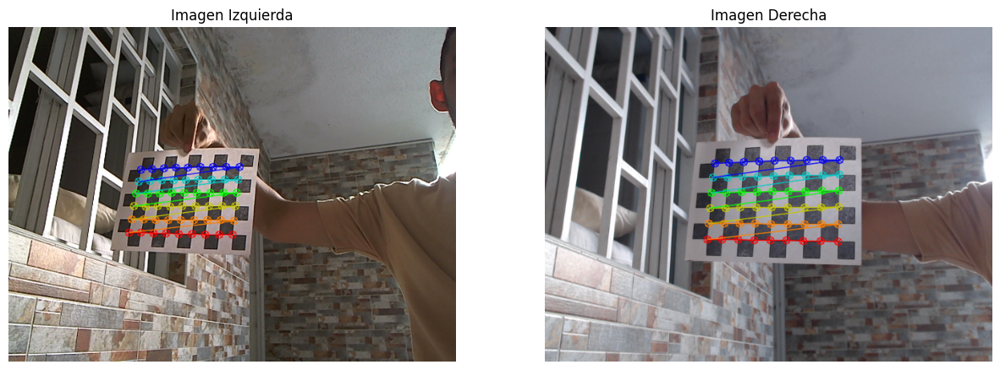

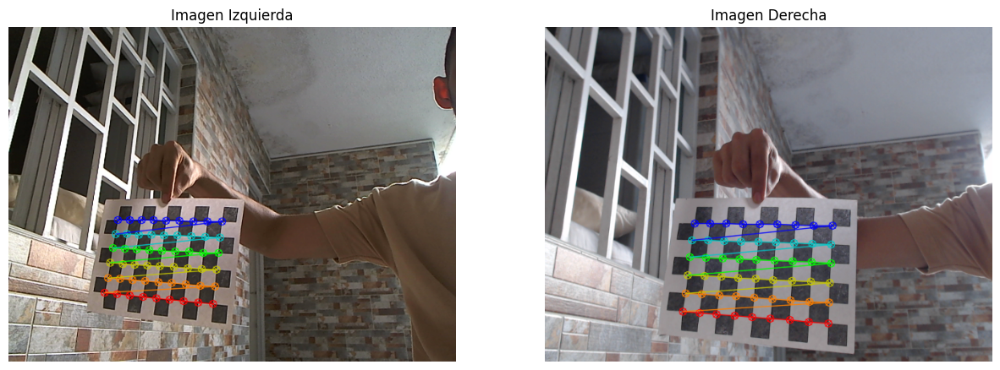

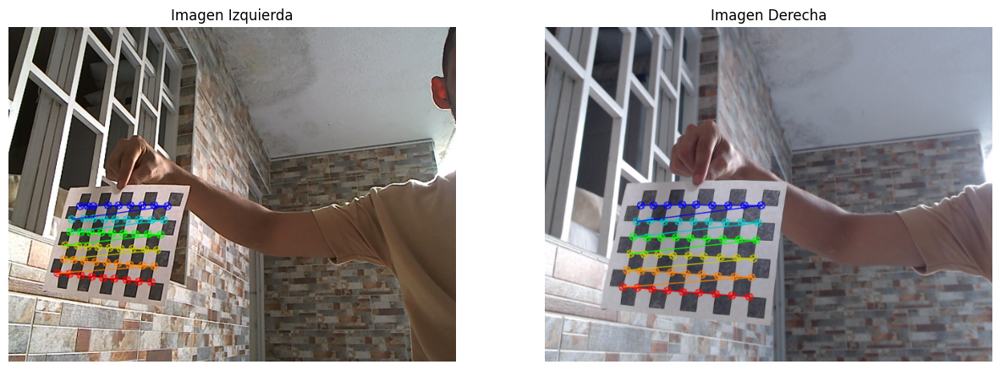

In [6]:
########### Encuentra las esquinas del tablero de ajedrez - Puntos de objetos y puntos de imagenes ###########

chessboardSize = (9,6)
frameSize = (640,480)

# Criterios de terminación
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Preparar puntos de objetos, como (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((chessboardSize[0] * chessboardSize[1], 3), np.float32)
objp[:,:2] = np.mgrid[0:chessboardSize[0],0:chessboardSize[1]].T.reshape(-1,2)

# Arreglos para guardar puntos de objetos y puntos de imagenes desde todas las imagenes.
objpoints = [] # Puntos 3D en el espacio del mundo real.
imgpointsL = [] # Puntos 2D en el plano de la imagen izquierda.
imgpointsR = [] # Puntos 2D en el plano de la imagen derecha.

imagesLeft = sorted(glob.glob('./datasets/stereoLeft/*.png'))
imagesRight = sorted(glob.glob('./datasets/stereoRight/*.png'))

print(f'Número de imágenes izquierdas encontradas: {len(imagesLeft)}')
print(f'Número de imágenes derechas encontradas: {len(imagesRight)}')

for imgLeft, imgRight in zip(imagesLeft, imagesRight):

    imgL = cv.imread(imgLeft)
    imgR = cv.imread(imgRight)
    grayL = cv.cvtColor(imgL, cv.COLOR_BGR2GRAY)
    grayR = cv.cvtColor(imgR, cv.COLOR_BGR2GRAY)

    # Encuentra las esquinas del tablero de ajedrez
    retL, cornersL = cv.findChessboardCorners(grayL, chessboardSize, None)
    retR, cornersR = cv.findChessboardCorners(grayR, chessboardSize, None)

    # Si las encontraste, agrega los puntos de objeto, puntos de imagen (refinanonlos despues )
    if retL and retR == True:
        objpoints.append(objp)

        # Detectar la ubicacion de las esquinas en subpixeles.
        cornersL = cv.cornerSubPix(grayL, cornersL, (11,11), (-1,-1), criteria)
        imgpointsL.append(cornersL)

        cornersR = cv.cornerSubPix(grayR, cornersR, (11,11), (-1,-1), criteria)
        imgpointsR.append(cornersR)

        cv.drawChessboardCorners(imgL, chessboardSize, cornersL, retL)
        cv.drawChessboardCorners(imgR, chessboardSize, cornersR, retR)


    #img_concatenada = np.hstack((imgL, imgR))
    #cv2_imshow(img_concatenada)
    #cv.waitKey(1000)

    mostrar_imagenes(imgL, imgR)


<font color="4C5FDA"> **Paso 3:** </font> Hasta el momento hemos detectado y dibujado las esquinas del tablero de ajedrez. Ahora, realizaremos la calibracion de las camaras con `cv.calibrateCamera`, obtendremos la matriz fundamental con `cv.getOptimalNewCameraMatrix` y finalmente para realizar la transformacion entre las 2 camaras usamos `cv.stereoCalibrate`

In [7]:
########### Calibración ###########

retL, cameraMatrixL, distL, rvecsL, tvecsL = cv.calibrateCamera(objpoints, imgpointsL, frameSize, None, None)
heightL, widthL, channelsL = imgL.shape
newCameraMatrixL, roi_L = cv.getOptimalNewCameraMatrix(cameraMatrixL, distL, (widthL, heightL), 1, (widthL, heightL))

retR, cameraMatrixR, distR, rvecsR, tvecsR = cv.calibrateCamera(objpoints, imgpointsR, frameSize, None, None)
heightR, widthR, channelsR = imgR.shape
newCameraMatrixR, roi_R = cv.getOptimalNewCameraMatrix(cameraMatrixR, distR, (widthR, heightR), 1, (widthR, heightR))


########### Stereo Vision Calibracion ###########

flags = 0
flags |= cv.CALIB_FIX_INTRINSIC
# Aquí fijamos las matrices intrínsecas de camara para que solo se calculen Rotacion, Translacion, Matriz Esencial y Matriz Fundamental.
# Por lo tanto los parámetros intrínsecos son los mismos

criteria_stereo= (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Este paso se realiza para la transformación entre las dos cámaras y calcular la matriz Esencial y Fundamental.
retStereo, newCameraMatrixL, distL, newCameraMatrixR, distR, rot, trans, essentialMatrix, fundamentalMatrix = cv.stereoCalibrate(objpoints, imgpointsL, imgpointsR, newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], criteria_stereo, flags)

# Matrices optimizadas para cada camara, calculadas a partir de la geometria relativa entre las 2 camaras.
print('Matriz izquierda: \n',newCameraMatrixL, '\n')
print('Matriz derecha: \n',newCameraMatrixR, '\n')


Matriz izquierda: 
 [[542.06761631   0.         327.18082291]
 [  0.         535.11437152 261.8241427 ]
 [  0.           0.           1.        ]] 

Matriz derecha: 
 [[621.37174544   0.         339.35998369]
 [  0.         608.62282929 266.65730165]
 [  0.           0.           1.        ]] 



<font color="4C5FDA"> **Paso 4:** </font> Ahora que tendremos que rectificar con los parametros obtenidos de la calibración para ello usamos la `cv.stereoRectify`y `initUndistortRectifyMap` y ultimo obtener el stereoMap

In [8]:
########## Rectificación Estereo ###########

# Calculamos las matrices de transformación que se aplicaran en cada imagen estéreo para realizar la rectificación.
rectifyScale= 1
rectL, rectR, projMatrixL, projMatrixR, Q, roi_L, roi_R= cv.stereoRectify(newCameraMatrixL, distL, newCameraMatrixR, distR, grayL.shape[::-1], rot, trans, rectifyScale,(0,0))

# Calculamos los mapas de rectificación y desdistorsión para cada una de las cámaras.
stereoMapL = cv.initUndistortRectifyMap(newCameraMatrixL, distL, rectL, projMatrixL, grayL.shape[::-1], cv.CV_16SC2)
stereoMapR = cv.initUndistortRectifyMap(newCameraMatrixR, distR, rectR, projMatrixR, grayR.shape[::-1], cv.CV_16SC2)

print("Parametros guardados!")

Parametros guardados!


In [10]:
# Camera parameters to undistort and rectify images
cv_file = cv.FileStorage()
cv_file.open('stereoMap.xml', cv.FileStorage_READ)

stereoMapL_x = cv_file.getNode('stereoMapL_x').mat()
stereoMapL_y = cv_file.getNode('stereoMapL_y').mat()
stereoMapR_x = cv_file.getNode('stereoMapR_x').mat()
stereoMapR_y = cv_file.getNode('stereoMapR_y').mat()


def undistortRectify(imageR, imageL):

    # Undistort and rectify images
    undistortedL= cv.remap(imageL, stereoMapL_x, stereoMapL_y, cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)
    undistortedR= cv.remap(imageR, stereoMapR_x, stereoMapR_y, cv.INTER_LANCZOS4, cv.BORDER_CONSTANT, 0)


    return undistortedR, undistortedL

## <font color='#EB9A54'>**Disparidad y Profundidad**</font>

In [11]:
def find_disparity(right_point, left_point, baseline, f_pixel, alpha, width):
    # CONVIERTE LA LONGITUD FOCAL f DE [mm] A [píxel]:
    f_pixel = (width * 0.5) / np.tan(np.radians(alpha) * 0.5)

    # CALCULA LA DISPARIDAD:
    disparity = right_point[0] - left_point[0]  # Desplazamiento entre los marcos izquierdo y derecho [píxeles]

    return disparity

In [12]:
# Función para calcular la profundidad basada en puntos de detección de rostros
def find_depth(right_point, left_point, baseline, f_pixel, alpha, width):
    # CONVIERTE LA LONGITUD FOCAL f DE [mm] A [píxel]:
    #f_pixel = (width * 0.5) / np.tan(np.radians(alpha) * 0.5)

    # CALCULA LA DISPARIDAD:
    disparity = right_point[0] - left_point[0]  # Desplazamiento entre los marcos izquierdo y derecho [píxeles]

    # CALCULA LA PROFUNDIDAD Z:
    zDepth = (baseline * f_pixel) / disparity if disparity != 0 else 0
    return zDepth

## <font color='#EB9A54'>**Detección del rostro**</font>

In [13]:
mp_face_detection = mp.solutions.face_detection
mp_draw = mp.solutions.drawing_utils

# Stereo vision setup parameters
B = 12              # Distance between the cameras [cm]
f = 3.67            # Camera lense's focal length [mm]
alpha = 70          # Camera field of view in the horizontal plane [degrees]

# Crea el detector de rostros
face_detection = mp_face_detection.FaceDetection(model_selection=0, min_detection_confidence=0.7)

images_left = sorted(glob.glob('./datasets/testLeft/*.png'))[:5]
images_right = sorted(glob.glob('./datasets/testRight/*.png'))[:5]

for img_path_left, img_path_right in zip(images_left, images_right):
    image_left = cv.imread(img_path_left)
    image_right = cv.imread(img_path_right)

    # Asumiendo alguna función de rectificación undistortRectify
    image_left, image_right = undistortRectify(image_left, image_right)

    # Asume el mismo tamaño para ambas imágenes
    height, width, _ = image_left.shape

    # Procesamiento de las imágenes
    results_left = face_detection.process(cv.cvtColor(image_left, cv.COLOR_BGR2RGB))
    results_right = face_detection.process(cv.cvtColor(image_right, cv.COLOR_BGR2RGB))

    if results_left.detections and results_right.detections:
        detection_left = results_left.detections[0]
        detection_right = results_right.detections[0]

        # Calcula los puntos centrales de las primeras detecciones
        center_point_left = (
            detection_left.location_data.relative_bounding_box.xmin + detection_left.location_data.relative_bounding_box.width / 2,
            detection_left.location_data.relative_bounding_box.ymin + detection_left.location_data.relative_bounding_box.height / 2
        )
        center_point_right = (
            detection_right.location_data.relative_bounding_box.xmin + detection_right.location_data.relative_bounding_box.width / 2,
            detection_right.location_data.relative_bounding_box.ymin + detection_right.location_data.relative_bounding_box.height / 2
        )

        # Asi es como se calcula la distancia.
        depth = find_depth(center_point_right, center_point_left, B, f, alpha, width)
        depth = depth/10
        depth_text = f"Distance: {round(depth, 1)} cm"
        print(depth_text)

        # Dibujar la distancia sobre las imágenes
        cv.putText(image_left, depth_text, (50, 50), cv.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)
        cv.putText(image_right, depth_text, (50, 50), cv.FONT_HERSHEY_SIMPLEX, 1.2, (0, 255, 0), 3)

    # Dibuja los resultados de detección sobre las imágenes
    if results_left.detections:
        for detection in results_left.detections:
            mp_draw.draw_detection(image_left, detection)
    if results_right.detections:
        for detection in results_right.detections:
            mp_draw.draw_detection(image_right, detection)

    # Verificación de detecciones para depuración
    print(f"Detecciones izquierda: {len(results_left.detections) if results_left.detections else 0}, Detecciones derecha: {len(results_right.detections) if results_right.detections else 0}")

    mostrar_imagenes(image_left, image_right)


error: OpenCV(4.8.0) /io/opencv/modules/imgproc/src/imgwarp.cpp:1709: error: (-215:Assertion failed) !_map1.empty() in function 'remap'
